##**EDA**

In [3]:
import pandas as pd
import seaborn as sns
from matplotlib import pyplot as plt
from datetime import datetime
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import numpy as np
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
import optuna
from lightgbm import LGBMClassifier
from sklearn.model_selection import StratifiedKFold, cross_val_score
from lightgbm import early_stopping, log_evaluation
from sklearn.metrics import accuracy_score, f1_score, roc_auc_score
import matplotlib.pyplot as plt
from sklearn.model_selection import learning_curve
import joblib

In [4]:
df = pd.read_csv('/Users/SHAD/code/Parvxi/Peaklytics/raw_data/Peaklytics_intial_data.csv')
df.head()

,Unnamed: 0,name,market,funding_total_usd,status,region,city,funding_rounds,founded_at,founded_month,...,round_A,round_B,round_C,round_D,round_E,round_F,round_G,round_H,country,quater
0,0,#waywire,News,1750000.0,acquired,New York City,New York,1.0,2012-06-01,2012-06,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,United States,Q2
1,2,'Rock' Your Paper,Publishing,40000.0,operating,Tallinn,Tallinn,1.0,2012-10-26,2012-10,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Estonia,Q4
2,3,(In)Touch Network,Electronics,1500000.0,operating,London,London,1.0,2011-04-01,2011-04,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,United Kingdom,Q2
3,4,-R- Ranch and Mine,Tourism,60000.0,operating,Dallas,Fort Worth,2.0,2014-01-01,2014-01,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,United States,Q1
4,10,"1,2,3 Listo",E-Commerce,40000.0,operating,Santiago,Las Condes,1.0,2012-01-01,2012-01,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Chile,Q1


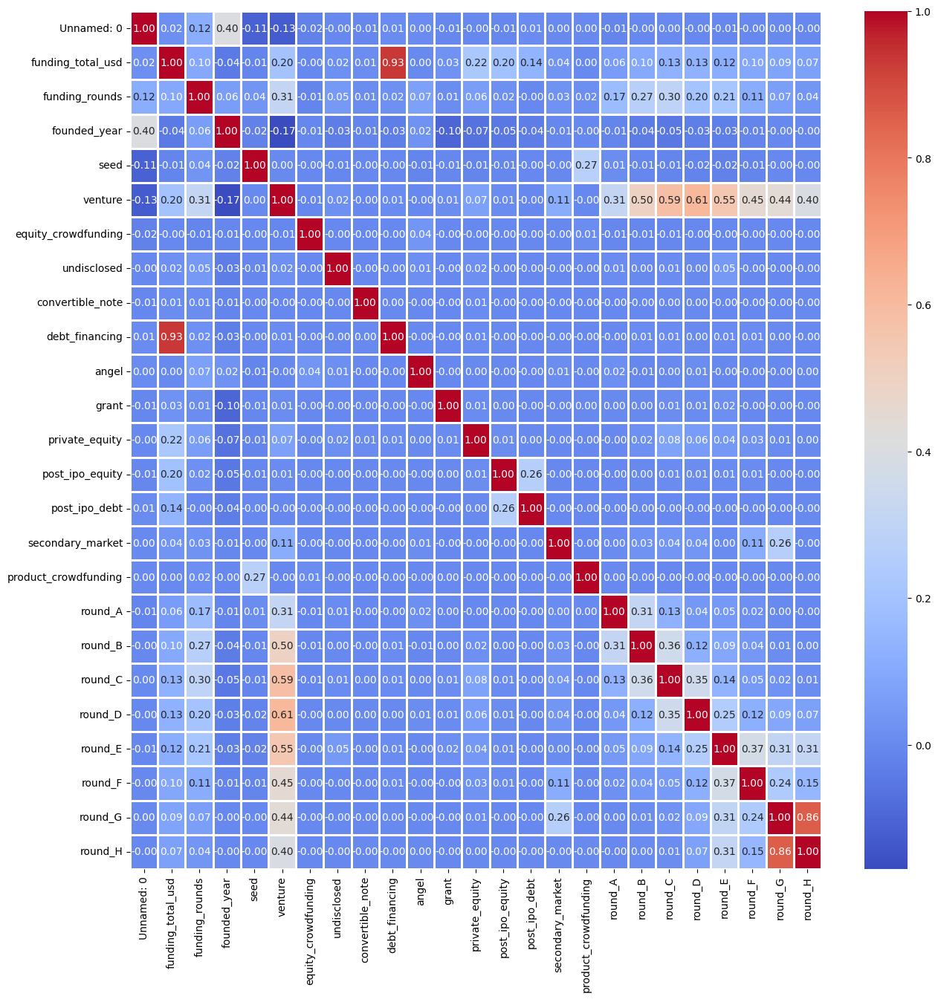

In [5]:
numerical_columns = df.select_dtypes(include=[np.number]).columns

corr_matrix = df[numerical_columns].corr()
fig, ax = plt.subplots(figsize=(15, 15))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', linewidths=0.8, fmt='.2f', ax=ax)
plt.show()

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 43268 entries, 0 to 43267
Data columns (total 37 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Unnamed: 0            43268 non-null  int64  
 1   name                  43268 non-null  object 
 2   market                43268 non-null  object 
 3   funding_total_usd     43268 non-null  float64
 4   status                43268 non-null  object 
 5   region                43268 non-null  object 
 6   city                  43268 non-null  object 
 7   funding_rounds        43268 non-null  float64
 8   founded_at            43268 non-null  object 
 9   founded_month         43268 non-null  object 
 10  founded_quarter       43268 non-null  object 
 11  founded_year          43268 non-null  float64
 12  first_funding_at      43268 non-null  object 
 13  last_funding_at       43268 non-null  object 
 14  seed                  43268 non-null  float64
 15  venture            

Detect the missing values, from the corr whatever is causing a problem like Round G, H will be dropped

In [7]:
missing_percentage = (df.isnull().sum() / df.shape[0]) * 100
missing_percentage_sorted = missing_percentage.sort_values(ascending=False)

print(missing_percentage_sorted)

convertible_note        35.356383
round_A                 35.356383
undisclosed             35.356383
grant                   35.356383
private_equity          35.356383
post_ipo_equity         35.356383
post_ipo_debt           35.356383
secondary_market        35.356383
product_crowdfunding    35.356383
round_B                 35.356383
debt_financing          35.356383
round_C                 35.356383
round_D                 35.356383
round_E                 35.356383
round_F                 35.356383
round_G                 35.356383
round_H                 35.356383
angel                   35.356383
country                  0.000000
Unnamed: 0               0.000000
name                     0.000000
founded_at               0.000000
market                   0.000000
funding_total_usd        0.000000
status                   0.000000
region                   0.000000
city                     0.000000
funding_rounds           0.000000
founded_month            0.000000
equity_crowdfu

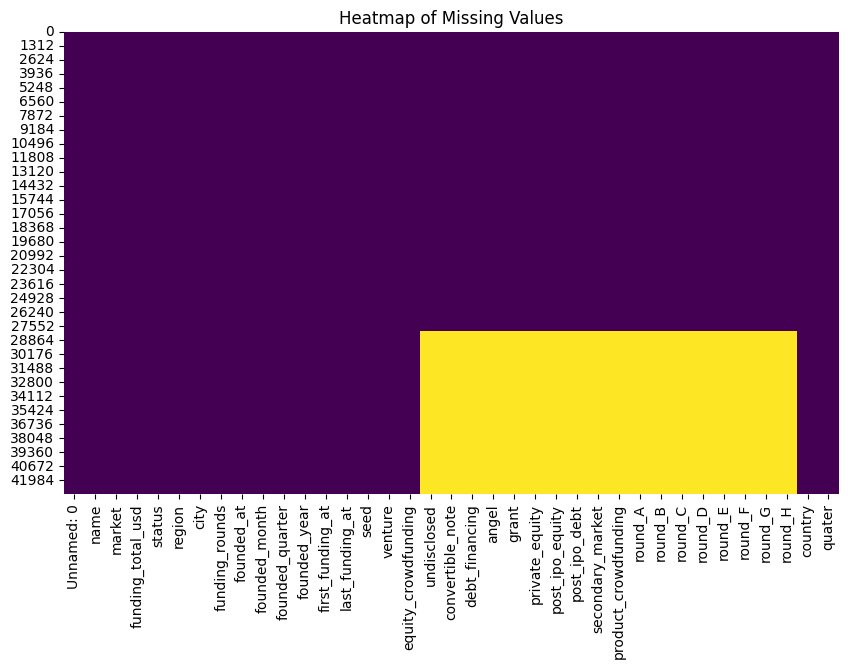

In [8]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
sns.heatmap(df.isnull(), cbar=False, cmap="viridis")
plt.title('Heatmap of Missing Values')
plt.show()

In [9]:
# As we see the status in in-balanced we are going to SMOTE that.
df['status'].value_counts(normalize=True)

status
operating    0.555561
acquired     0.222220
closed       0.222220
Name: proportion, dtype: float64

In [10]:
df['first_funding_at'] = pd.to_datetime(df['first_funding_at'], errors='coerce')
df['last_funding_at'] = pd.to_datetime(df['last_funding_at'], errors='coerce')
df['founded_at'] = pd.to_datetime(df['founded_at'],  errors='coerce')

###Feature Engineering

In [11]:
df['funding_category'] = df.apply(
    lambda x: 'Single Round - Traditional' if x['funding_rounds'] == 1 and x[['seed', 'venture']].sum() == 0
    else 'Single Round - Non-traditional' if x['funding_rounds'] == 1 and x[['seed', 'venture']].sum() > 0
    else 'Multiple Rounds', axis=1
)

In [12]:
current_year = datetime.now().year
df['company_age'] = current_year - df['founded_at'].dt.year

Remove unnecessary features for Peaklytics, as well as features that have high correlation with others.

In [13]:
df.drop(columns=['Unnamed: 0','round_G', 'round_H', 'founded_quarter', 'quater', 'founded_month', 'name', 'founded_year', 'founded_at', 'debt_financing', 'first_funding_at',	'last_funding_at'], inplace=True)

In [14]:

df['status']  = df['status'].apply(lambda x: 'operating' if x == 'acquired' else x)


In [15]:
df['status'].value_counts()

status
operating    33653
closed        9615
Name: count, dtype: int64

Save the cleaned data to a new csv file

In [16]:
df.to_csv('cleaned_peaklytics_data.csv', index=False)

# Preprocessing

In [17]:
cleaned_df = pd.read_csv('cleaned_peaklytics_data.csv')

In [18]:
cleaned_df.head()

,market,funding_total_usd,status,region,city,funding_rounds,seed,venture,equity_crowdfunding,undisclosed,...,product_crowdfunding,round_A,round_B,round_C,round_D,round_E,round_F,country,funding_category,company_age
0,News,1750000.0,operating,New York City,New York,1.0,1750000.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,United States,Single Round - Non-traditional,12
1,Publishing,40000.0,operating,Tallinn,Tallinn,1.0,40000.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Estonia,Single Round - Non-traditional,12
2,Electronics,1500000.0,operating,London,London,1.0,1500000.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,United Kingdom,Single Round - Non-traditional,13
3,Tourism,60000.0,operating,Dallas,Fort Worth,2.0,0.0,0.0,60000.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,United States,Multiple Rounds,10
4,E-Commerce,40000.0,operating,Santiago,Las Condes,1.0,40000.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Chile,Single Round - Non-traditional,12


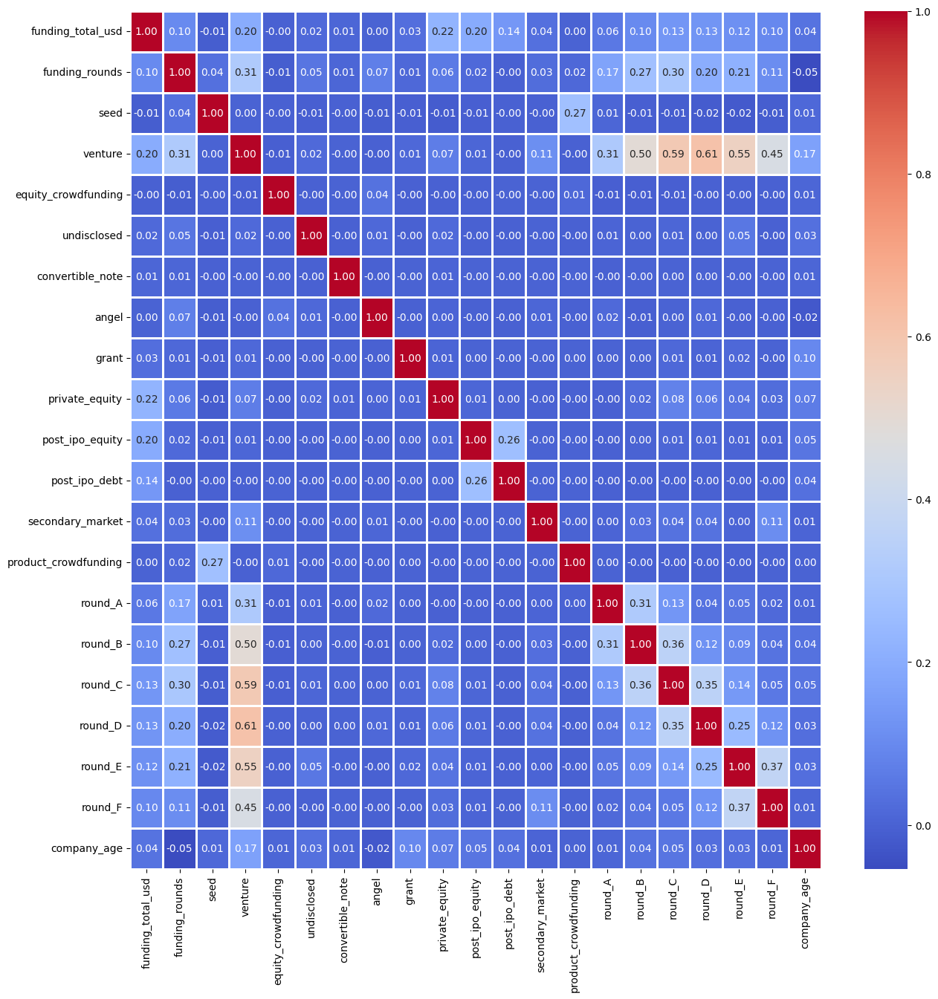

In [19]:
numerical_columns = cleaned_df.select_dtypes(include=['number']).columns

corr_matrix = cleaned_df[numerical_columns].corr()
fig, ax = plt.subplots(figsize=(15, 15))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', linewidths=0.8, fmt='.2f', ax=ax)
plt.show()

In [20]:
missing_percentage = (cleaned_df.isnull().sum() / df.shape[0]) * 100
missing_percentage_sorted = missing_percentage.sort_values(ascending=False)

print(missing_percentage_sorted)

private_equity          35.356383
undisclosed             35.356383
post_ipo_debt           35.356383
post_ipo_equity         35.356383
round_A                 35.356383
grant                   35.356383
angel                   35.356383
convertible_note        35.356383
round_B                 35.356383
product_crowdfunding    35.356383
round_C                 35.356383
round_D                 35.356383
round_E                 35.356383
round_F                 35.356383
secondary_market        35.356383
country                  0.000000
funding_category         0.000000
market                   0.000000
funding_total_usd        0.000000
equity_crowdfunding      0.000000
venture                  0.000000
seed                     0.000000
funding_rounds           0.000000
city                     0.000000
region                   0.000000
status                   0.000000
company_age              0.000000
dtype: float64


In [21]:
cleaned_df.dropna(inplace=True)

In [22]:
missing_percentage = (cleaned_df.isnull().sum() / cleaned_df.shape[0]) * 100
missing_percentage_sorted = missing_percentage.sort_values(ascending=False)

print(missing_percentage_sorted)

market                  0.0
post_ipo_equity         0.0
funding_category        0.0
country                 0.0
round_F                 0.0
round_E                 0.0
round_D                 0.0
round_C                 0.0
round_B                 0.0
round_A                 0.0
product_crowdfunding    0.0
secondary_market        0.0
post_ipo_debt           0.0
private_equity          0.0
funding_total_usd       0.0
grant                   0.0
angel                   0.0
convertible_note        0.0
undisclosed             0.0
equity_crowdfunding     0.0
venture                 0.0
seed                    0.0
funding_rounds          0.0
city                    0.0
region                  0.0
status                  0.0
company_age             0.0
dtype: float64


## Removing outliers, scaling, encoding, and imputing

In [23]:
numerical_columns = cleaned_df.select_dtypes(include=['number']).columns
numerical_columns

Index(['funding_total_usd', 'funding_rounds', 'seed', 'venture',
       'equity_crowdfunding', 'undisclosed', 'convertible_note', 'angel',
       'grant', 'private_equity', 'post_ipo_equity', 'post_ipo_debt',
       'secondary_market', 'product_crowdfunding', 'round_A', 'round_B',
       'round_C', 'round_D', 'round_E', 'round_F', 'company_age'],
      dtype='object')

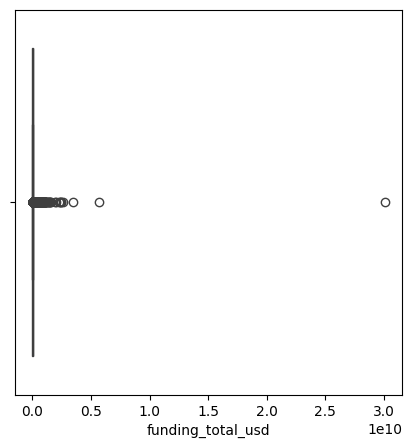

In [24]:
fig, ax = plt.subplots(figsize=(5,5))
sns.boxplot(x='funding_total_usd', data=cleaned_df, ax=ax)
plt.show()

In [25]:
# https://www.geeksforgeeks.org/detect-and-remove-the-outliers-using-python/

Q1 = cleaned_df['funding_total_usd'].quantile(0.25)
Q3 = cleaned_df['funding_total_usd'].quantile(0.75)
IQR = Q3 - Q1

lower_bound = Q1 - 1.25 * IQR
upper_bound = Q3 + 1.25 * IQR

cleaned_df = cleaned_df[(cleaned_df['funding_total_usd'] >= lower_bound) & (cleaned_df['funding_total_usd'] <= upper_bound)]

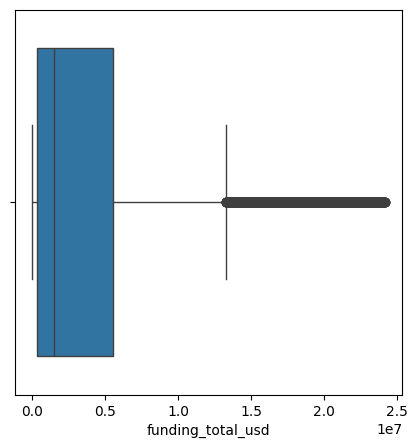

In [26]:
fig, ax = plt.subplots(figsize=(5,5))
sns.boxplot(x='funding_total_usd', data=cleaned_df, ax=ax)
plt.show()

In [27]:
duplicates_before = cleaned_df.duplicated().sum()
print(duplicates_before)
cleaned_df.drop_duplicates(inplace=True)

58


In [28]:
duplicates_after = cleaned_df.duplicated().sum()
print(duplicates_after)

0


In [29]:
cleaned_df[['market', 'country', 'funding_category', 'city', 'region']].nunique()

market               678
country              103
funding_category       3
city                2810
region               863
dtype: int64

In [30]:
cleaned_df = pd.get_dummies(cleaned_df, columns=['funding_category', 'country'], drop_first=True)
cleaned_df.head()

,market,funding_total_usd,status,region,city,funding_rounds,seed,venture,equity_crowdfunding,undisclosed,...,country_Tunisia,country_Turkey,country_Uganda,country_Ukraine,country_United Arab Emirates,country_United Kingdom,country_United States,country_Uruguay,country_Uzbekistan,country_Viet Nam
0,News,1750000.0,operating,New York City,New York,1.0,1750000.0,0.0,0.0,0.0,...,False,False,False,False,False,False,True,False,False,False
1,Publishing,40000.0,operating,Tallinn,Tallinn,1.0,40000.0,0.0,0.0,0.0,...,False,False,False,False,False,False,False,False,False,False
2,Electronics,1500000.0,operating,London,London,1.0,1500000.0,0.0,0.0,0.0,...,False,False,False,False,False,True,False,False,False,False
3,Tourism,60000.0,operating,Dallas,Fort Worth,2.0,0.0,0.0,60000.0,0.0,...,False,False,False,False,False,False,True,False,False,False
4,E-Commerce,40000.0,operating,Santiago,Las Condes,1.0,40000.0,0.0,0.0,0.0,...,False,False,False,False,False,False,False,False,False,False


In [31]:
market_freq = cleaned_df['market'].value_counts(normalize=True)
cleaned_df['market_freq'] = cleaned_df['market'].map(market_freq)

city_freq = cleaned_df['city'].value_counts(normalize=True)
cleaned_df['city_freq'] = cleaned_df['city'].map(city_freq)

region_freq = cleaned_df['region'].value_counts(normalize=True)
cleaned_df['region_freq'] = cleaned_df['region'].map(region_freq)

cleaned_df = cleaned_df.drop(columns=['market', 'city', 'region'])
cleaned_df.head()

,funding_total_usd,status,funding_rounds,seed,venture,equity_crowdfunding,undisclosed,convertible_note,angel,grant,...,country_Ukraine,country_United Arab Emirates,country_United Kingdom,country_United States,country_Uruguay,country_Uzbekistan,country_Viet Nam,market_freq,city_freq,region_freq
0,1750000.0,operating,1.0,1750000.0,0.0,0.0,0.0,0.0,0.0,0.0,...,False,False,False,True,False,False,False,0.007591,0.061900,0.068442
1,40000.0,operating,1.0,40000.0,0.0,0.0,0.0,0.0,0.0,0.0,...,False,False,False,False,False,False,False,0.001678,0.001090,0.001090
2,1500000.0,operating,1.0,1500000.0,0.0,0.0,0.0,0.0,0.0,0.0,...,False,False,True,False,False,False,False,0.000755,0.033256,0.040134
3,60000.0,operating,2.0,0.0,0.0,60000.0,0.0,0.0,0.0,0.0,...,False,False,False,True,False,False,False,0.000545,0.000419,0.009688
4,40000.0,operating,1.0,40000.0,0.0,0.0,0.0,0.0,0.0,0.0,...,False,False,False,False,False,False,False,0.036234,0.000084,0.004991


In [32]:
le = LabelEncoder()
cleaned_df['status'] = le.fit_transform(cleaned_df['status'])

In [33]:
cleaned_df.shape

(23845, 129)

In [34]:
total_null_values = cleaned_df.isnull().sum().sum()
print(f"Total null values: {total_null_values}")

Total null values: 0


In [35]:
cleaned_df.columns

Index(['funding_total_usd', 'status', 'funding_rounds', 'seed', 'venture',
       'equity_crowdfunding', 'undisclosed', 'convertible_note', 'angel',
       'grant',
       ...
       'country_Ukraine', 'country_United Arab Emirates',
       'country_United Kingdom', 'country_United States', 'country_Uruguay',
       'country_Uzbekistan', 'country_Viet Nam', 'market_freq', 'city_freq',
       'region_freq'],
      dtype='object', length=129)

##Handle imbalanced data, Splitting the data.

In [36]:
X = cleaned_df.drop(columns=['status'])
y = cleaned_df['status']

# Split into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Apply SMOTE to balance the training data
smote = SMOTE(random_state=42)
X_train_resampled, y_train_resampled = smote.fit_resample(X_train, y_train)

# Further split the resampled data into training and validation sets for validating
X_train, X_val, y_train, y_val = train_test_split(X_train_resampled, y_train_resampled, test_size=0.2, random_state=42)

# Initialize the StandardScaler
scaler = StandardScaler()

# Scale numerical columns for training, validation, and test sets after splitting for sure ( Data leackage )
X_train[numerical_columns] = scaler.fit_transform(X_train[numerical_columns])
X_val[numerical_columns] = scaler.transform(X_val[numerical_columns])
X_test[numerical_columns] = scaler.transform(X_test[numerical_columns])

In [37]:
from sklearn.dummy import DummyClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix


baseline_model = DummyClassifier(strategy='stratified')
baseline_model.fit(X_train_resampled, y_train_resampled)

y_pred_baseline = baseline_model.predict(X_test)


accuracy_baseline = accuracy_score(y_test, y_pred_baseline)
precision_baseline = precision_score(y_test, y_pred_baseline, average='weighted')
recall_baseline = recall_score(y_test, y_pred_baseline, average='weighted')
f1_baseline = f1_score(y_test, y_pred_baseline, average='weighted')
conf_matrix = confusion_matrix(y_test, y_pred_baseline)


print(f"Baseline Accuracy: {accuracy_baseline}")
print(f"Baseline Precision: {precision_baseline}")
print(f"Baseline Recall: {recall_baseline}")
print(f"Baseline F1 Score: {f1_baseline}")
print("Confusion Matrix:")
print(conf_matrix)

Baseline Accuracy: 0.5095407842314951
Baseline Precision: 0.9012833890272594
Baseline Recall: 0.5095407842314951
Baseline F1 Score: 0.6305499018713699
Confusion Matrix:
[[ 148  118]
 [2221 2282]]




---



1. Hyperparameter Tuning: Use Optuna with cross-validation to find the best hyperparameters.
2. Model Training: Train the model using the best hyperparameters and early stopping with a validation set.
3. Model Evaluation: Evaluate the model on the test set to get final performance metrics.

In [38]:
# Clean up column names for both train and test sets
X_train_resampled.columns = X_train_resampled.columns.str.replace('[^A-Za-z0-9_]+', '', regex=True)
X_test.columns = X_test.columns.str.replace('[^A-Za-z0-9_]+', '', regex=True)

# Objective function for Optuna
def objective(trial):
    param = {
        'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.1),
        'n_estimators': trial.suggest_int('n_estimators', 100, 500),
        'max_depth': trial.suggest_int('max_depth', 3, 6),
        'num_leaves': trial.suggest_int('num_leaves', 20, 50),
        'min_child_samples': trial.suggest_int('min_child_samples', 20, 100),
        'subsample': trial.suggest_float('subsample', 0.6, 0.9),
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.6, 0.9),
        'reg_alpha': trial.suggest_float('reg_alpha', 1, 10.0),
        'reg_lambda': trial.suggest_float('reg_lambda', 1, 10.0),
        'drop_rate': trial.suggest_float('drop_rate', 0.2, 0.4),
        'max_drop': trial.suggest_int('max_drop', 5, 30),
        'random_state': 45
    }

    # Initialize the model with the suggested parameters
    lgbm_model = LGBMClassifier(**param)

    # Perform cross-validation to evaluate the model's performance
    cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
    f1 = cross_val_score(lgbm_model, X_train_resampled, y_train_resampled, cv=cv, scoring='f1', n_jobs=-1).mean()

    return f1

# Optimize hyperparameters using Optuna
study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=50)

# Best hyperparameters found by Optuna
best_params = study.best_params
print("Best hyperparameters found by Optuna:", best_params)

# Train the model with the best parameters
lgbm_model = LGBMClassifier(**best_params)

[I 2024-10-18 16:40:41,933] A new study created in memory with name: no-name-53e9e8e0-0c3c-400f-9f0d-f9bbf4680da3


[LightGBM] [Info] Number of positive: 14401, number of negative: 14400
[LightGBM] [Info] Number of positive: 14401, number of negative: 14401
[LightGBM] [Info] Number of positive: 14401, number of negative: 14401
[LightGBM] [Info] Number of positive: 14401, number of negative: 14401
[LightGBM] [Info] Number of positive: 14400, number of negative: 14401
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.016603 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.021120 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.

[LightGBM] [Info] Total Bins 3669[LightGBM] [Info] Total Bins 3653

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.020510 seconds.
You can set `force_ro

[I 2024-10-18 16:40:47,846] Trial 0 finished with value: 0.9483931559738261 and parameters: {'learning_rate': 0.0737819211334404, 'n_estimators': 268, 'max_depth': 6, 'num_leaves': 21, 'min_child_samples': 27, 'subsample': 0.6222550898284017, 'colsample_bytree': 0.8778395194075825, 'reg_alpha': 7.070296471831573, 'reg_lambda': 5.046619706256552, 'drop_rate': 0.2534391482340941, 'max_drop': 29}. Best is trial 0 with value: 0.9483931559738261.


[LightGBM] [Info] Number of positive: 14401, number of negative: 14401
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.007422 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3616
[LightGBM] [Info] Number of data points in the train set: 28802, number of used features: 57
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 14401, number of negative: 14401
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.009163 seconds.
You can set `force_row

[I 2024-10-18 16:40:51,143] Trial 1 finished with value: 0.9534506653661863 and parameters: {'learning_rate': 0.09962662711012894, 'n_estimators': 335, 'max_depth': 5, 'num_leaves': 34, 'min_child_samples': 60, 'subsample': 0.7820385141525763, 'colsample_bytree': 0.8282719696994504, 'reg_alpha': 4.957976773005525, 'reg_lambda': 3.1658570039970204, 'drop_rate': 0.231766102984177, 'max_drop': 20}. Best is trial 1 with value: 0.9534506653661863.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 14401, number of negative: 14400
[LightGBM] [Info] Number of positive: 14401, number of negative: 14401
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.015819 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not 

[I 2024-10-18 16:40:52,417] Trial 2 finished with value: 0.8540914996215383 and parameters: {'learning_rate': 0.022910876880579453, 'n_estimators': 114, 'max_depth': 4, 'num_leaves': 29, 'min_child_samples': 74, 'subsample': 0.8420089045276644, 'colsample_bytree': 0.8774364718928838, 'reg_alpha': 9.009381603503957, 'reg_lambda': 5.261013688209244, 'drop_rate': 0.30137584705098047, 'max_drop': 19}. Best is trial 1 with value: 0.9534506653661863.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-10-18 16:40:54,563] Trial 3 finished with value: 0.9445437336576177 and parameters: {'learning_rate': 0.09561312828871449, 'n_estimators': 337, 'max_depth': 4, 'num_leaves': 38, 'min_child_samples': 84, 'subsample': 0.7728506139715607, 'colsample_bytree': 0.7635528093411956, 'reg_alpha': 7.666226960219241, 'reg_lambda': 4.5802022011244485, 'drop_rate': 0.22269943261558767, 'max_drop': 13}. Best is trial 1 with value: 0.9534506653661863.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-10-18 16:40:57,411] Trial 4 finished with value: 0.9167428693094439 and parameters: {'learning_rate': 0.028328556348255124, 'n_estimators': 301, 'max_depth': 5, 'num_leaves': 23, 'min_child_samples': 68, 'subsample': 0.6552648952970505, 'colsample_bytree': 0.8877957121155728, 'reg_alpha': 3.86810101234028, 'reg_lambda': 4.889882238554245, 'drop_rate': 0.2367617454386126, 'max_drop': 21}. Best is trial 1 with value: 0.9534506653661863.


[LightGBM] [Info] Number of positive: 14400, number of negative: 14401
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.007554 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3592
[LightGBM] [Info] Number of data points in the train set: 28801, number of used features: 57
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.499983 -> initscore=-0.000069
[LightGBM] [Info] Start training from score -0.000069
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 14401, number of negative: 14

[I 2024-10-18 16:40:58,233] Trial 5 finished with value: 0.8766675916592046 and parameters: {'learning_rate': 0.05062666495042502, 'n_estimators': 133, 'max_depth': 3, 'num_leaves': 24, 'min_child_samples': 57, 'subsample': 0.671551742789622, 'colsample_bytree': 0.7876694401436165, 'reg_alpha': 3.39053341632938, 'reg_lambda': 6.1473170053740755, 'drop_rate': 0.3503144048370002, 'max_drop': 26}. Best is trial 1 with value: 0.9534506653661863.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-10-18 16:41:00,921] Trial 6 finished with value: 0.944807866867636 and parameters: {'learning_rate': 0.0672938345373381, 'n_estimators': 288, 'max_depth': 5, 'num_leaves': 21, 'min_child_samples': 20, 'subsample': 0.8915045918297273, 'colsample_bytree': 0.6608550392974829, 'reg_alpha': 8.02808728372895, 'reg_lambda': 4.671816564631882, 'drop_rate': 0.2732310458703193, 'max_drop': 8}. Best is trial 1 with value: 0.9534506653661863.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-10-18 16:41:02,189] Trial 7 finished with value: 0.8328290140109944 and parameters: {'learning_rate': 0.013377733144021154, 'n_estimators': 214, 'max_depth': 3, 'num_leaves': 26, 'min_child_samples': 27, 'subsample': 0.8880612111254034, 'colsample_bytree': 0.7638519910292126, 'reg_alpha': 9.333102978083948, 'reg_lambda': 1.8013361839277158, 'drop_rate': 0.36974482709651235, 'max_drop': 26}. Best is trial 1 with value: 0.9534506653661863.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-10-18 16:41:06,674] Trial 8 finished with value: 0.9566218630925045 and parameters: {'learning_rate': 0.09624465562218504, 'n_estimators': 391, 'max_depth': 6, 'num_leaves': 35, 'min_child_samples': 32, 'subsample': 0.8403422815014627, 'colsample_bytree': 0.6522297133663951, 'reg_alpha': 4.108641562485762, 'reg_lambda': 9.267212315707273, 'drop_rate': 0.3258278510313515, 'max_drop': 10}. Best is trial 8 with value: 0.9566218630925045.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 14400, number of negative: 14401
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.007996 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3633
[LightGBM] [Info] Number of data points in the train set: 28801, number of used features: 63
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.499983 -> initscore=-0.000069
[LightGBM] [Info] Start training from score -0.000069
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 14401, number of negative: 14

[I 2024-10-18 16:41:07,367] Trial 9 finished with value: 0.8448394732497506 and parameters: {'learning_rate': 0.03244990667542858, 'n_estimators': 105, 'max_depth': 3, 'num_leaves': 44, 'min_child_samples': 43, 'subsample': 0.6051793148116517, 'colsample_bytree': 0.6762725490583502, 'reg_alpha': 2.5657161337431047, 'reg_lambda': 2.0389314147428426, 'drop_rate': 0.2752903239898967, 'max_drop': 29}. Best is trial 8 with value: 0.9566218630925045.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-10-18 16:41:12,433] Trial 10 finished with value: 0.95627820436529 and parameters: {'learning_rate': 0.08175482872340187, 'n_estimators': 466, 'max_depth': 6, 'num_leaves': 50, 'min_child_samples': 98, 'subsample': 0.716107305340747, 'colsample_bytree': 0.6069266096167608, 'reg_alpha': 1.6941698077537684, 'reg_lambda': 9.407650885783468, 'drop_rate': 0.3244584059101954, 'max_drop': 8}. Best is trial 8 with value: 0.9566218630925045.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 14400, number of negative: 14401
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.007973 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3554
[LightGBM] [Info] Number of data points in the train set: 28801, number of used features: 51
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.499983 -> initscore=-0.000069
[LightGBM] [Info] Start training from score -0.000069
[LightGBM] [Info] Number of positive: 14401, number of negative: 14

[I 2024-10-18 16:41:17,545] Trial 11 finished with value: 0.9568074371320131 and parameters: {'learning_rate': 0.08369851196134184, 'n_estimators': 471, 'max_depth': 6, 'num_leaves': 50, 'min_child_samples': 88, 'subsample': 0.7317889863801637, 'colsample_bytree': 0.614100754628797, 'reg_alpha': 1.4605347968546578, 'reg_lambda': 9.81504199233908, 'drop_rate': 0.3258000199329032, 'max_drop': 5}. Best is trial 11 with value: 0.9568074371320131.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-10-18 16:41:23,052] Trial 12 finished with value: 0.9571150125133576 and parameters: {'learning_rate': 0.08528782963400548, 'n_estimators': 472, 'max_depth': 6, 'num_leaves': 38, 'min_child_samples': 47, 'subsample': 0.8071138540869874, 'colsample_bytree': 0.6001513665240756, 'reg_alpha': 1.2455540427776688, 'reg_lambda': 9.959403131383494, 'drop_rate': 0.3973301801386361, 'max_drop': 5}. Best is trial 12 with value: 0.9571150125133576.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 14400, number of negative: 14401
[LightGBM] [Info] Number of positive: 14401, number of negative: 14400
[LightGBM] [Info] Auto-choosing r

[I 2024-10-18 16:41:28,910] Trial 13 finished with value: 0.9542394692546952 and parameters: {'learning_rate': 0.05474897907510442, 'n_estimators': 492, 'max_depth': 6, 'num_leaves': 50, 'min_child_samples': 48, 'subsample': 0.7336799387788024, 'colsample_bytree': 0.6011739124668571, 'reg_alpha': 1.1072006257342095, 'reg_lambda': 7.770967952396443, 'drop_rate': 0.39798830571105476, 'max_drop': 5}. Best is trial 12 with value: 0.9571150125133576.


[LightGBM] [Info] Number of positive: 14400, number of negative: 14401
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003724 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3548
[LightGBM] [Info] Number of data points in the train set: 28801, number of used features: 48
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.499983 -> initscore=-0.000069
[LightGBM] [Info] Start training from score -0.000069
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 14401, number of negative: 14400
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006293 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=tr

[I 2024-10-18 16:41:32,454] Trial 14 finished with value: 0.9514144108899899 and parameters: {'learning_rate': 0.0827343311887974, 'n_estimators': 424, 'max_depth': 5, 'num_leaves': 43, 'min_child_samples': 96, 'subsample': 0.8017623676837666, 'colsample_bytree': 0.6993597652592854, 'reg_alpha': 6.053975526573638, 'reg_lambda': 7.863062475507977, 'drop_rate': 0.38343085945101557, 'max_drop': 13}. Best is trial 12 with value: 0.9571150125133576.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-10-18 16:41:37,033] Trial 15 finished with value: 0.9518263614974973 and parameters: {'learning_rate': 0.06504230956547084, 'n_estimators': 418, 'max_depth': 6, 'num_leaves': 44, 'min_child_samples': 82, 'subsample': 0.697892943850438, 'colsample_bytree': 0.7121224285381609, 'reg_alpha': 2.401208666824889, 'reg_lambda': 9.873357625613234, 'drop_rate': 0.3508273313744536, 'max_drop': 5}. Best is trial 12 with value: 0.9571150125133576.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-10-18 16:41:42,355] Trial 16 finished with value: 0.949243456559163 and parameters: {'learning_rate': 0.043227287704535454, 'n_estimators': 445, 'max_depth': 6, 'num_leaves': 40, 'min_child_samples': 51, 'subsample': 0.8221709282649774, 'colsample_bytree': 0.6305166168774886, 'reg_alpha': 1.0942033382760101, 'reg_lambda': 8.02037050567983, 'drop_rate': 0.2047522912343787, 'max_drop': 14}. Best is trial 12 with value: 0.9571150125133576.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 14400, number of negative: 14401
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004834 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3637
[LightGBM] [Info] Number of data points in the train set: 28801, number of used features: 65
[LightGBM] [Info] Number of positive: 14401, number of negative: 14400
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.499983 -> initscore=-0.000069
[LightGBM] [Info] Start training from score -0.000069
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[I 2024-10-18 16:41:44,662] Trial 17 finished with value: 0.943483012734134 and parameters: {'learning_rate': 0.08456739096057495, 'n_estimators': 373, 'max_depth': 4, 'num_leaves': 30, 'min_child_samples': 39, 'subsample': 0.7525253635737332, 'colsample_bytree': 0.720968781902364, 'reg_alpha': 2.659991775649659, 'reg_lambda': 7.0480704329444634, 'drop_rate': 0.31837326930401716, 'max_drop': 10}. Best is trial 12 with value: 0.9571150125133576.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-10-18 16:41:48,686] Trial 18 finished with value: 0.9504346805008359 and parameters: {'learning_rate': 0.06672212750882554, 'n_estimators': 488, 'max_depth': 5, 'num_leaves': 46, 'min_child_samples': 66, 'subsample': 0.7577490799955889, 'colsample_bytree': 0.6364932853309195, 'reg_alpha': 4.995893662491559, 'reg_lambda': 8.71612513892987, 'drop_rate': 0.34656445280751624, 'max_drop': 16}. Best is trial 12 with value: 0.9571150125133576.


[LightGBM] [Info] Number of positive: 14400, number of negative: 14401
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004210 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3582
[LightGBM] [Info] Number of data points in the train set: 28801, number of used features: 52
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.499983 -> initscore=-0.000069
[LightGBM] [Info] Start training from score -0.000069
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gai

[I 2024-10-18 16:41:51,224] Trial 19 finished with value: 0.947428799392535 and parameters: {'learning_rate': 0.08993719268838002, 'n_estimators': 218, 'max_depth': 6, 'num_leaves': 39, 'min_child_samples': 85, 'subsample': 0.6936851664041919, 'colsample_bytree': 0.6769901060205952, 'reg_alpha': 2.0509124405163095, 'reg_lambda': 9.914170192210806, 'drop_rate': 0.39952004355359266, 'max_drop': 7}. Best is trial 12 with value: 0.9571150125133576.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-10-18 16:41:54,580] Trial 20 finished with value: 0.9497495666488269 and parameters: {'learning_rate': 0.07455578284597494, 'n_estimators': 381, 'max_depth': 5, 'num_leaves': 34, 'min_child_samples': 75, 'subsample': 0.80400224356916, 'colsample_bytree': 0.630022732662386, 'reg_alpha': 3.2979798931003232, 'reg_lambda': 6.542687338199105, 'drop_rate': 0.28750505509537, 'max_drop': 10}. Best is trial 12 with value: 0.9571150125133576.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-10-18 16:41:59,404] Trial 21 finished with value: 0.9568681164485433 and parameters: {'learning_rate': 0.09190596005532009, 'n_estimators': 407, 'max_depth': 6, 'num_leaves': 31, 'min_child_samples': 36, 'subsample': 0.8542362451506091, 'colsample_bytree': 0.6551426485881549, 'reg_alpha': 4.265089764119523, 'reg_lambda': 8.8784265795481, 'drop_rate': 0.3258737741644034, 'max_drop': 10}. Best is trial 12 with value: 0.9571150125133576.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-10-18 16:42:04,779] Trial 22 finished with value: 0.9571318882549866 and parameters: {'learning_rate': 0.08953366437289068, 'n_estimators': 456, 'max_depth': 6, 'num_leaves': 30, 'min_child_samples': 39, 'subsample': 0.8684993465918714, 'colsample_bytree': 0.6004064470533081, 'reg_alpha': 5.933518388015242, 'reg_lambda': 8.795236896139047, 'drop_rate': 0.36824619205577014, 'max_drop': 5}. Best is trial 22 with value: 0.9571318882549866.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 14400, number of negative: 14401
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.020841 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3637
[LightGBM] [Info] Number of data points in the train set: 28801, numb

[I 2024-10-18 16:42:09,986] Trial 23 finished with value: 0.9560514976045049 and parameters: {'learning_rate': 0.08912289088166069, 'n_estimators': 432, 'max_depth': 6, 'num_leaves': 30, 'min_child_samples': 40, 'subsample': 0.867643974938275, 'colsample_bytree': 0.6002259210378689, 'reg_alpha': 6.4203084872674365, 'reg_lambda': 8.685618105293207, 'drop_rate': 0.3704831652431553, 'max_drop': 8}. Best is trial 22 with value: 0.9571318882549866.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 14400, number of negative: 14401
[LightGBM] [Info] Auto-choosi

[I 2024-10-18 16:42:15,375] Trial 24 finished with value: 0.9549153202790126 and parameters: {'learning_rate': 0.074402196850939, 'n_estimators': 451, 'max_depth': 6, 'num_leaves': 32, 'min_child_samples': 34, 'subsample': 0.8631237539740948, 'colsample_bytree': 0.6477815928597297, 'reg_alpha': 5.331321007540731, 'reg_lambda': 8.603824303227947, 'drop_rate': 0.3694904695343713, 'max_drop': 11}. Best is trial 22 with value: 0.9571318882549866.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-10-18 16:42:19,042] Trial 25 finished with value: 0.953039684336732 and parameters: {'learning_rate': 0.09356723849869729, 'n_estimators': 397, 'max_depth': 5, 'num_leaves': 27, 'min_child_samples': 50, 'subsample': 0.8551786773561363, 'colsample_bytree': 0.6848017127289963, 'reg_alpha': 6.078490966132764, 'reg_lambda': 6.85466702068299, 'drop_rate': 0.3833829391316779, 'max_drop': 7}. Best is trial 22 with value: 0.9571318882549866.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-10-18 16:42:25,011] Trial 26 finished with value: 0.957175214603296 and parameters: {'learning_rate': 0.07931846761860127, 'n_estimators': 500, 'max_depth': 6, 'num_leaves': 36, 'min_child_samples': 44, 'subsample': 0.8202309407505485, 'colsample_bytree': 0.6228666777761455, 'reg_alpha': 4.260446334263442, 'reg_lambda': 7.637628993866422, 'drop_rate': 0.3426526062804191, 'max_drop': 16}. Best is trial 26 with value: 0.957175214603296.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 14400, number of negative: 14401
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.007774 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is 

[I 2024-10-18 16:42:29,584] Trial 27 finished with value: 0.9504810650290801 and parameters: {'learning_rate': 0.061990304845981156, 'n_estimators': 500, 'max_depth': 5, 'num_leaves': 37, 'min_child_samples': 44, 'subsample': 0.8195832423970727, 'colsample_bytree': 0.623812926664845, 'reg_alpha': 7.227608876170811, 'reg_lambda': 7.498876550665278, 'drop_rate': 0.344355163216722, 'max_drop': 23}. Best is trial 26 with value: 0.957175214603296.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-10-18 16:42:34,064] Trial 28 finished with value: 0.9519204080880057 and parameters: {'learning_rate': 0.07721089822872416, 'n_estimators': 350, 'max_depth': 6, 'num_leaves': 41, 'min_child_samples': 56, 'subsample': 0.7892543690349554, 'colsample_bytree': 0.7241279314846676, 'reg_alpha': 8.421375746572796, 'reg_lambda': 5.8916146596118235, 'drop_rate': 0.38271792263356486, 'max_drop': 16}. Best is trial 26 with value: 0.957175214603296.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf[LightGBM] [Warning] No fu

[I 2024-10-18 16:42:39,608] Trial 29 finished with value: 0.9522960525154442 and parameters: {'learning_rate': 0.05958482342682671, 'n_estimators': 457, 'max_depth': 6, 'num_leaves': 37, 'min_child_samples': 26, 'subsample': 0.8240536715008604, 'colsample_bytree': 0.8260947096609266, 'reg_alpha': 6.839442042468576, 'reg_lambda': 7.171494741272557, 'drop_rate': 0.3624021135031205, 'max_drop': 17}. Best is trial 26 with value: 0.957175214603296.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 14400, number of negative: 14401
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.013973 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3616
[LightGBM] [Info] Number of data points in the train set: 28801, number of used features: 61
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.499983 -> initscore=-0.000069
[LightGBM] [Info] Start training from score -0.000069
[LightGBM] [Warning] No further splits with positive gain, best gai

[I 2024-10-18 16:42:42,949] Trial 30 finished with value: 0.9440202172563499 and parameters: {'learning_rate': 0.07012652226422356, 'n_estimators': 475, 'max_depth': 4, 'num_leaves': 33, 'min_child_samples': 46, 'subsample': 0.8820567936966777, 'colsample_bytree': 0.6261323399050063, 'reg_alpha': 4.579540665412105, 'reg_lambda': 8.443063390867794, 'drop_rate': 0.30697544561174894, 'max_drop': 12}. Best is trial 26 with value: 0.957175214603296.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-10-18 16:42:48,225] Trial 31 finished with value: 0.9564471183354442 and parameters: {'learning_rate': 0.09093051025156827, 'n_estimators': 415, 'max_depth': 6, 'num_leaves': 36, 'min_child_samples': 34, 'subsample': 0.8430757151616676, 'colsample_bytree': 0.660097778855121, 'reg_alpha': 5.660311070301258, 'reg_lambda': 9.10662483285902, 'drop_rate': 0.33373516817594745, 'max_drop': 6}. Best is trial 26 with value: 0.957175214603296.


[LightGBM] [Info] Number of positive: 14400, number of negative: 14401
[LightGBM] [Info] Number of positive: 14401, number of negative: 14400
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.007959 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3637
[LightGBM] [Info] Number of data points in the train set: 28801, number of used features: 65
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.499983 -> initscore=-0.000069
[LightGBM] [Info] Start training from score -0.000069
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.010883 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Total Bins 3662
[LightGBM] [Info] Number of data poi

[I 2024-10-18 16:42:54,277] Trial 32 finished with value: 0.9595710640683862 and parameters: {'learning_rate': 0.09895987437591257, 'n_estimators': 500, 'max_depth': 6, 'num_leaves': 32, 'min_child_samples': 37, 'subsample': 0.8713464124510275, 'colsample_bytree': 0.6425103727307265, 'reg_alpha': 4.445472242665346, 'reg_lambda': 8.245624169785064, 'drop_rate': 0.3597342886404677, 'max_drop': 9}. Best is trial 32 with value: 0.9595710640683862.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 14400, number of negative: 14401
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.007334 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3610
[LightGBM] [Info] Number of data points in the train set: 28801, number of used features: 58
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.4

[I 2024-10-18 16:43:00,057] Trial 33 finished with value: 0.9594564249487769 and parameters: {'learning_rate': 0.09923121638906009, 'n_estimators': 494, 'max_depth': 6, 'num_leaves': 27, 'min_child_samples': 53, 'subsample': 0.8978691100898546, 'colsample_bytree': 0.6175529872812818, 'reg_alpha': 3.3561573509760527, 'reg_lambda': 8.172563295066746, 'drop_rate': 0.35820640277798727, 'max_drop': 7}. Best is trial 32 with value: 0.9595710640683862.


[LightGBM] [Info] Number of positive: 14400, number of negative: 14401
[LightGBM] [Info] Number of positive: 14401, number of negative: 14400
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.008370 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3610
[LightGBM] [Info] Number of data points in the train set: 28801, number of used features: 58
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.499983 -> initscore=-0.000069
[LightGBM] [Info] Start training from score -0.000069
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.010225 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3632
[LightGBM] [Info] Number of data points in the train set: 28801, number of used features: 58
[LightGBM] [Info] 

[I 2024-10-18 16:43:05,701] Trial 34 finished with value: 0.9591718020702016 and parameters: {'learning_rate': 0.09995797541413409, 'n_estimators': 496, 'max_depth': 6, 'num_leaves': 28, 'min_child_samples': 52, 'subsample': 0.8993055316657625, 'colsample_bytree': 0.6422078955965532, 'reg_alpha': 3.361074397865112, 'reg_lambda': 8.233211554690389, 'drop_rate': 0.3574708449538343, 'max_drop': 15}. Best is trial 32 with value: 0.9595710640683862.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 14400, number of negative: 14401
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006037 seconds.


[I 2024-10-18 16:43:10,241] Trial 35 finished with value: 0.958561355861165 and parameters: {'learning_rate': 0.0996982178659017, 'n_estimators': 495, 'max_depth': 5, 'num_leaves': 28, 'min_child_samples': 63, 'subsample': 0.895294826575171, 'colsample_bytree': 0.6893895974013736, 'reg_alpha': 3.364913297377292, 'reg_lambda': 3.552854435833643, 'drop_rate': 0.35865286702242666, 'max_drop': 20}. Best is trial 32 with value: 0.9595710640683862.


[LightGBM] [Info] Number of positive: 14400, number of negative: 14401
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006414 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3590
[LightGBM] [Info] Number of data points in the train set: 28801, number of used features: 56
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.499983 -> initscore=-0.000069
[LightGBM] [Info] Start training from score -0.000069
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 14401, number of negative: 14400
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.010258 seconds.
You can set `force_row_wise=true` to remov

[I 2024-10-18 16:43:13,892] Trial 36 finished with value: 0.9560565148280554 and parameters: {'learning_rate': 0.09831798707850051, 'n_estimators': 429, 'max_depth': 5, 'num_leaves': 27, 'min_child_samples': 63, 'subsample': 0.8994301104688506, 'colsample_bytree': 0.7370117744035906, 'reg_alpha': 3.428753980837182, 'reg_lambda': 3.4568768089925297, 'drop_rate': 0.308024097511609, 'max_drop': 20}. Best is trial 32 with value: 0.9595710640683862.


[LightGBM] [Info] Number of positive: 14400, number of negative: 14401
[LightGBM] [Info] Number of positive: 14401, number of negative: 14400
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.011591 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3592
[LightGBM] [Info] Number of data points in the train set: 28801, number of used features: 57
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.499983 -> initscore=-0.000069
[LightGBM] [Info] Start training from score -0.000069
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead 

[I 2024-10-18 16:43:15,709] Trial 37 finished with value: 0.939455845324102 and parameters: {'learning_rate': 0.09900800979570652, 'n_estimators': 155, 'max_depth': 5, 'num_leaves': 25, 'min_child_samples': 57, 'subsample': 0.8786521678018254, 'colsample_bytree': 0.6934204632602032, 'reg_alpha': 3.249677200932989, 'reg_lambda': 3.636714273102344, 'drop_rate': 0.35723678384450175, 'max_drop': 22}. Best is trial 32 with value: 0.9595710640683862.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 14400, number of negative: 14401
[LightGBM] [Info] Number of positive: 14401, number of negative: 14400
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.018033 seconds.
You 

[I 2024-10-18 16:43:18,041] Trial 38 finished with value: 0.946424929885849 and parameters: {'learning_rate': 0.09973768365359818, 'n_estimators': 312, 'max_depth': 4, 'num_leaves': 22, 'min_child_samples': 61, 'subsample': 0.8982798229005833, 'colsample_bytree': 0.6705828829983874, 'reg_alpha': 2.9378659006847907, 'reg_lambda': 2.4927426002632984, 'drop_rate': 0.3377797069472752, 'max_drop': 19}. Best is trial 32 with value: 0.9595710640683862.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-10-18 16:43:20,725] Trial 39 finished with value: 0.9510984515712856 and parameters: {'learning_rate': 0.0940331718120228, 'n_estimators': 261, 'max_depth': 5, 'num_leaves': 28, 'min_child_samples': 73, 'subsample': 0.8742900813643737, 'colsample_bytree': 0.6450811368932858, 'reg_alpha': 3.832852577815567, 'reg_lambda': 1.0613931293130605, 'drop_rate': 0.3588065333936291, 'max_drop': 14}. Best is trial 32 with value: 0.9595710640683862.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-10-18 16:43:23,809] Trial 40 finished with value: 0.9337329793099318 and parameters: {'learning_rate': 0.04165793006712868, 'n_estimators': 444, 'max_depth': 4, 'num_leaves': 20, 'min_child_samples': 54, 'subsample': 0.8371103539797408, 'colsample_bytree': 0.7618454236010928, 'reg_alpha': 4.7862310173186255, 'reg_lambda': 5.300055684414771, 'drop_rate': 0.379289003427325, 'max_drop': 24}. Best is trial 32 with value: 0.9595710640683862.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-10-18 16:43:29,583] Trial 41 finished with value: 0.9590770155988801 and parameters: {'learning_rate': 0.0953717744523801, 'n_estimators': 495, 'max_depth': 6, 'num_leaves': 25, 'min_child_samples': 53, 'subsample': 0.8868162923653005, 'colsample_bytree': 0.6182024587700501, 'reg_alpha': 3.6754579124969147, 'reg_lambda': 8.184989749093548, 'drop_rate': 0.3390568683337361, 'max_drop': 18}. Best is trial 32 with value: 0.9595710640683862.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 14400, number of negative: 14401
[LightGBM] [Info] Auto-choosi

[I 2024-10-18 16:43:35,093] Trial 42 finished with value: 0.9589695757044204 and parameters: {'learning_rate': 0.0956210799658704, 'n_estimators': 482, 'max_depth': 6, 'num_leaves': 24, 'min_child_samples': 53, 'subsample': 0.8843831046266096, 'colsample_bytree': 0.6427991836335335, 'reg_alpha': 3.7242015601279137, 'reg_lambda': 8.209426780975377, 'drop_rate': 0.3559021263891017, 'max_drop': 18}. Best is trial 32 with value: 0.9595710640683862.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 14400, number of negative: 14401
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.010223 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3610
[LightGBM] [Info] Number of data points in the train set: 28801, number of used features: 58
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.499983 -> initscore=-0.000069
[LightGBM] [Info] Start training from score -0.000069
[LightGBM] [Info] Number of positive: 14401, number of negative: 14400
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing row-wise multi-threading, th

[I 2024-10-18 16:43:40,877] Trial 43 finished with value: 0.9583148595882136 and parameters: {'learning_rate': 0.09469294895936389, 'n_estimators': 479, 'max_depth': 6, 'num_leaves': 24, 'min_child_samples': 54, 'subsample': 0.8817078030095696, 'colsample_bytree': 0.6438126172813982, 'reg_alpha': 3.8031281129318097, 'reg_lambda': 8.113547712907256, 'drop_rate': 0.3350832243415327, 'max_drop': 18}. Best is trial 32 with value: 0.9595710640683862.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 14400, number of negative: 14401
[LightGBM] [Info] Number of positive: 14401, number of negative: 14400
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.016462 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3590
[LightGBM] [Info] Number of data points in the train set: 28801, number o

[I 2024-10-18 16:43:46,854] Trial 44 finished with value: 0.9580015567446993 and parameters: {'learning_rate': 0.08651715576379478, 'n_estimators': 476, 'max_depth': 6, 'num_leaves': 26, 'min_child_samples': 59, 'subsample': 0.6468272170434697, 'colsample_bytree': 0.6640369958063994, 'reg_alpha': 2.0597829603423854, 'reg_lambda': 8.232691557274629, 'drop_rate': 0.3507721593077194, 'max_drop': 18}. Best is trial 32 with value: 0.9595710640683862.


[LightGBM] [Info] Number of positive: 14400, number of negative: 14401
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.007203 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3610
[LightGBM] [Info] Number of data points in the train set: 28801, number of used features: 58
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.499983 -> initscore=-0.000069
[LightGBM] [Info] Start training from score -0.000069
[LightGBM] [Info] Number of positive: 14401, number of negative: 14400
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.008623 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3632
[LightGBM] [Info] Number of data points in the train set: 28801, number of used features: 58
[LightGBM] [Info] 

[I 2024-10-18 16:43:52,614] Trial 45 finished with value: 0.9580177337011591 and parameters: {'learning_rate': 0.09566840638441379, 'n_estimators': 460, 'max_depth': 6, 'num_leaves': 23, 'min_child_samples': 51, 'subsample': 0.8493903028617443, 'colsample_bytree': 0.6161097662073868, 'reg_alpha': 4.507258282812829, 'reg_lambda': 7.41020692843229, 'drop_rate': 0.31352812093087457, 'max_drop': 15}. Best is trial 32 with value: 0.9595710640683862.


[LightGBM] [Info] Number of positive: 14400, number of negative: 14401
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.007436 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3647
[LightGBM] [Info] Number of data points in the train set: 28801, number of used features: 70
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.499983 -> initscore=-0.000069
[LightGBM] [Info] Start training from score -0.000069
[LightGBM] [Info] Number of positive: 14401, number of negative: 14400
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.011997 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3683
[LightGBM] [Info] Number of data points in the train set: 28801, number of used features: 73
[LightGBM] [Info] 

[I 2024-10-18 16:43:58,102] Trial 46 finished with value: 0.9150002461440134 and parameters: {'learning_rate': 0.013335993868735192, 'n_estimators': 440, 'max_depth': 6, 'num_leaves': 25, 'min_child_samples': 29, 'subsample': 0.8859811886329634, 'colsample_bytree': 0.8084454100879032, 'reg_alpha': 5.08194372239961, 'reg_lambda': 6.367274635774861, 'drop_rate': 0.2508012968418724, 'max_drop': 12}. Best is trial 32 with value: 0.9595710640683862.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 14400, number of negative: 14401
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.010126 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3588
[LightGBM] [Info] Number of data points in the train set: 28801, number of used features: 55
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.4

[I 2024-10-18 16:44:03,599] Trial 47 finished with value: 0.9320386424980607 and parameters: {'learning_rate': 0.019612341273999537, 'n_estimators': 483, 'max_depth': 6, 'num_leaves': 22, 'min_child_samples': 69, 'subsample': 0.8659597590384536, 'colsample_bytree': 0.8533932899675511, 'reg_alpha': 2.849375335545311, 'reg_lambda': 4.282883345757282, 'drop_rate': 0.28994495659951164, 'max_drop': 9}. Best is trial 32 with value: 0.9595710640683862.


[LightGBM] [Info] Number of positive: 14400, number of negative: 14401
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006150 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3610
[LightGBM] [Info] Number of data points in the train set: 28801, number of used features: 58
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.499983 -> initscore=-0.000069
[LightGBM] [Info] Start training from score -0.000069
[LightGBM] [Info] Number of positive: 14401, number of negative: 14400
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.008186 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3632
[LightGBM] [Info] Number of data points in the train set: 28801, number of used features: 58
[LightGBM] [Info] 

[I 2024-10-18 16:44:09,487] Trial 48 finished with value: 0.957424785476969 and parameters: {'learning_rate': 0.0801495480955098, 'n_estimators': 500, 'max_depth': 6, 'num_leaves': 28, 'min_child_samples': 53, 'subsample': 0.8993201969635477, 'colsample_bytree': 0.6380055561961483, 'reg_alpha': 3.7527333799529714, 'reg_lambda': 9.493191520961904, 'drop_rate': 0.38935985695883524, 'max_drop': 21}. Best is trial 32 with value: 0.9595710640683862.


[LightGBM] [Info] Number of positive: 14400, number of negative: 14401
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.011245 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3616
[LightGBM] [Info] Number of data points in the train set: 28801, number of used features: 61
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.499983 -> initscore=-0.000069
[LightGBM] [Info] Start training from score -0.000069
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 14401, number of negative: 14400
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.009893 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=tr

[I 2024-10-18 16:44:13,837] Trial 49 finished with value: 0.9560667060715196 and parameters: {'learning_rate': 0.08698032624687821, 'n_estimators': 357, 'max_depth': 6, 'num_leaves': 32, 'min_child_samples': 49, 'subsample': 0.8857903813905138, 'colsample_bytree': 0.7028534369947926, 'reg_alpha': 2.2447633874433652, 'reg_lambda': 5.763300027335315, 'drop_rate': 0.3746216023944014, 'max_drop': 30}. Best is trial 32 with value: 0.9595710640683862.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Info] Number of positive: 14391, number of negative: 14410
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003950 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3633
[LightGBM] [Info] Number of data points in the train set: 28801, number of used features: 65
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.499670 -> initscore=-0.001319
[LightGBM] [Info] Start training from score -0.001319
Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[Ligh

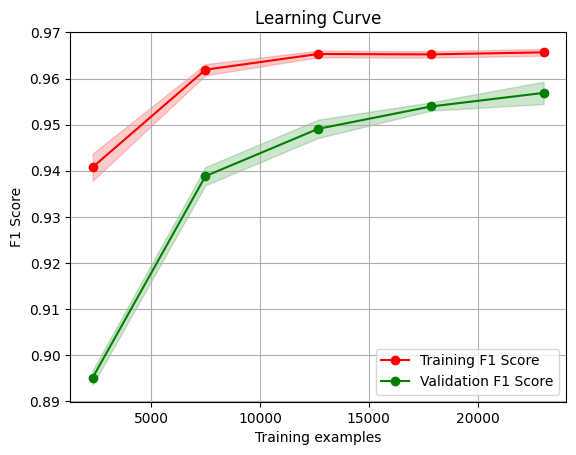

In [39]:
# Clean up column names for both train and test sets
X_train.columns = X_train.columns.str.replace('[^A-Za-z0-9_]+', '', regex=True)
X_val.columns = X_val.columns.str.replace('[^A-Za-z0-9_]+', '', regex=True)
X_test.columns = X_test.columns.str.replace('[^A-Za-z0-9_]+', '', regex=True)

lgbm_model.fit(X_train, y_train,
               eval_set=[(X_val, y_val)],
               eval_metric='f1',
               callbacks=[early_stopping(stopping_rounds=100), log_evaluation(50)])

# Evaluate the model
y_pred = lgbm_model.predict(X_test)
y_pred_proba = lgbm_model.predict_proba(X_test)[:, 1]

accuracy = accuracy_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)
roc_auc = roc_auc_score(y_test, y_pred_proba)

print(f"Test Accuracy: {accuracy:.2f}")
print(f"Test F1 Score: {f1:.2f}")
print(f"Test ROC AUC Score: {roc_auc:.2f}")

# Plot learning curve
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

train_sizes, train_scores, val_scores = learning_curve(
    lgbm_model, X_train, y_train, cv=cv, scoring='f1', n_jobs=-1)

# Calculate mean and standard deviation for training and validation scores
train_mean = np.mean(train_scores, axis=1)
train_std = np.std(train_scores, axis=1)
val_mean = np.mean(val_scores, axis=1)
val_std = np.std(val_scores, axis=1)

# Plot the learning curve
plt.figure()
plt.plot(train_sizes, train_mean, 'o-', color='r', label='Training F1 Score')
plt.plot(train_sizes, val_mean, 'o-', color='g', label='Validation F1 Score')
plt.fill_between(train_sizes, train_mean - train_std, train_mean + train_std, color='r', alpha=0.2)
plt.fill_between(train_sizes, val_mean - val_std, val_mean + val_std, color='g', alpha=0.2)

plt.title('Learning Curve')
plt.xlabel('Training examples')
plt.ylabel('F1 Score')
plt.legend(loc='best')
plt.grid()
plt.show()

In [41]:
# Save the trained model to a file
joblib.dump(lgbm_model, 'final_lgbm_model.pkl')

['final_lgbm_model.pkl']